<a href="https://colab.research.google.com/github/jurados/GenerativeMultimodalAI/blob/main/Laboratorio_1_Modelos_Generativos_de_Im%C3%A1genes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Restyle for Toonification

Principle of the toonification detailed [here](https://www.justinpinkney.com/blog/2020/toonify-yourself/)

In [ ]:
import os
os.chdir('/content')
CODE_DIR = 'restyle-encoder'

In [ ]:
!git clone https://github.com/yuval-alaluf/restyle-encoder.git $CODE_DIR

Cloning into 'restyle-encoder'...
remote: Enumerating objects: 330, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 330 (delta 0), reused 3 (delta 0), pack-reused 326 (from 1)
Receiving objects: 100% (330/330), 28.12 MiB | 11.45 MiB/s, done.
Resolving deltas: 100% (121/121), done.


In [ ]:
!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
!sudo unzip ninja-linux.zip -d /usr/local/bin/
!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

--2025-09-18 00:38:02--  https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/1335132/d2f252e2-9801-11e7-9fbf-bc7b4e4b5c83?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-18T01%3A27%3A21Z&rscd=attachment%3B+filename%3Dninja-linux.zip&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-09-18T00%3A26%3A41Z&ske=2025-09-18T01%3A27%3A21Z&sks=b&skv=2018-11-09&sig=c%2Bx%2BG%2B6qXTPEwPJh%2FMiqIISEasXfnvqPyIXvN%2BorvzE%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1ODE1NjE4MywibmJmIjoxNzU4MTU1ODgzLCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVj

In [ ]:
os.chdir(f'./{CODE_DIR}')

Change in `from imp import reload` to `from importlib import reload` in `/usr/local/lib/python3.12/dist-packages/IPython/extensions/autoreload.py`

In [ ]:
# Deal with old dependency
fname = "/usr/local/lib/python3.12/dist-packages/IPython/extensions/autoreload.py"
with open(fname, 'r') as f:
  text = f.read()
text = text.replace('from imp import reload', 'from importlib import reload')
with open(fname, 'w') as f:
  f.write(text)

# Deal with old dependency
with open('/content/restyle-encoder/scripts/align_faces_parallel.py', 'r') as f:
  text = f.read()
text = text.replace('PIL.Image.ANTIALIAS', 'PIL.Image.Resampling.LANCZOS')
with open('/content/restyle-encoder/scripts/align_faces_parallel.py', 'w') as f:
  f.write(text)

In [ ]:
from argparse import Namespace
import time
import os
import sys
import pprint
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms

sys.path.append(".")
sys.path.append("..")

from utils.common import tensor2im
from models.psp import pSp
from models.e4e import e4e

%load_ext autoreload
%autoreload 2

## Step 1: Select Experiment Type
Select which experiment you wish to perform inference on:

In [ ]:
#@title Select which experiment you wish to perform inference on: { run: "auto" }
experiment_type = 'ffhq_encode' #@param ['ffhq_encode', 'cars_encode', 'church_encode', 'horse_encode', 'afhq_wild_encode', 'toonify']

## Step 2: Prepare to Download Pretrained Models
As part of this repository, we provide pretrained models for each of the above experiments. Here, we'll create the download command needed for downloading the desired model.

Note: in this notebook, we'll be using ReStyle applied over pSp for all domains except for the horses domain where we'll be using e4e. This is done since e4e is generally able to generate more realistic reconstructions on this domain.

In [ ]:
MODEL_PATHS = {
    "ffhq_encode": {"id": "1sw6I2lRIB0MpuJkpc8F5BJiSZrc0hjfE", "name": "restyle_psp_ffhq_encode.pt"},
    "cars_encode": {"id": "1zJHqHRQ8NOnVohVVCGbeYMMr6PDhRpPR", "name": "restyle_psp_cars_encode.pt"},
    "church_encode": {"id": "1bcxx7mw-1z7dzbJI_z7oGpWG1oQAvMaD", "name": "restyle_psp_church_encode.pt"},
    "horse_encode": {"id": "19_sUpTYtJmhSAolKLm3VgI-ptYqd-hgY", "name": "restyle_e4e_horse_encode.pt"},
    "afhq_wild_encode": {"id": "1GyFXVTNDUw3IIGHmGS71ChhJ1Rmslhk7", "name": "restyle_psp_afhq_wild_encode.pt"},
    "toonify": {"id": "1GtudVDig59d4HJ_8bGEniz5huaTSGO_0", "name": "restyle_psp_toonify.pt"}
}

path = MODEL_PATHS[experiment_type]

## Step 3: Define Inference Parameters

Below we have a dictionary defining parameters such as the path to the pretrained model to use and the path to the image to perform inference on.  
While we provide default values to run this script, feel free to change as needed.

In [ ]:
EXPERIMENT_DATA_ARGS = {
    "ffhq_encode": {
        "model_path": "pretrained_models/restyle_psp_ffhq_encode.pt",
        "image_path": "notebooks/images/face_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "cars_encode": {
        "model_path": "pretrained_models/restyle_psp_cars_encode.pt",
        "image_path": "notebooks/images/car_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((192, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "church_encode": {
        "model_path": "pretrained_models/restyle_psp_church_encode.pt",
        "image_path": "notebooks/images/church_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "horse_encode": {
        "model_path": "pretrained_models/restyle_e4e_horse_encode.pt",
        "image_path": "notebooks/images/horse_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "afhq_wild_encode": {
        "model_path": "pretrained_models/restyle_psp_afhq_wild_encode.pt",
        "image_path": "notebooks/images/afhq_wild_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
    "toonify": {
        "model_path": "pretrained_models/restyle_psp_toonify.pt",
        "image_path": "notebooks/images/toonify_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    },
}

In [ ]:
EXPERIMENT_ARGS = EXPERIMENT_DATA_ARGS[experiment_type]

To reduce the number of requests to fetch the model, we'll check if the model was previously downloaded and saved before downloading the model.  
We'll download the model for the selected experiment and save it to the folder `../pretrained_models`.

We also need to verify that the model was downloaded correctly. All of our models should weigh approximately 800MB - 1GB.  
Note that if the file weighs several KBs, you most likely encounter a "quota exceeded" error from Google Drive. In that case, you should try downloading the model again after a few hours.

In [ ]:
! gdown --id {path["id"]}
! mkdir /content/restyle-encoder/pretrained_models/
! mv {path["name"]} /content/restyle-encoder/pretrained_models/

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1GtudVDig59d4HJ_8bGEniz5huaTSGO_0
From (redirected): https://drive.google.com/uc?id=1GtudVDig59d4HJ_8bGEniz5huaTSGO_0&confirm=t&uuid=f6fadfd9-1a20-4fbe-b35a-8198d6e169e1
To: /content/restyle-encoder/restyle_psp_toonify.pt
100% 955M/955M [00:14<00:00, 63.8MB/s]


Si no funciona con el lasso gdrive, los modelos ffhq y toonify estan en mi carpeta personal. Usar el codigo siguiente:

```
! mkdir /content/restyle-encoder/pretrained_models/
! wget https://users.dcc.uchile.cl/~vbarrier/ECI2026_MModal_GenAI/data/restyle_psp_toonify.pt /content/restyle-encoder/pretrained_models/restyle_psp_toonify.pt
! wget https://users.dcc.uchile.cl/~vbarrier/ECI2026_MModal_GenAI/data/restyle_psp_ffhq_encode.pt /content/restyle-encoder/pretrained_models/restyle_psp_ffhq_encode.pt
```

## Step 4: Load Pretrained Model
We assume that you have downloaded all relevant models and placed them in the directory defined by the above dictionary.

In [ ]:
model_path = EXPERIMENT_ARGS['model_path']
ckpt = torch.load(model_path, map_location='cpu')

In [ ]:
opts = ckpt['opts']
pprint.pprint(opts)

{'batch_size': 8,
 'board_interval': 50,
 'checkpoint_path': '',
 'dataset_type': 'ffhq_encode',
 'device': 'cuda:0',
 'encoder_type': 'BackboneEncoder',
 'exp_dir': '',
 'id_lambda': 1.0,
 'image_interval': 100,
 'input_nc': 6,
 'l2_lambda': 1.0,
 'learning_rate': 0.0001,
 'lpips_lambda': 0.8,
 'max_steps': 500000,
 'moco_lambda': 0,
 'n_iters_per_batch': 5,
 'optim_name': 'ranger',
 'output_size': 1024,
 'save_interval': 1000,
 'start_from_latent_avg': True,
 'stylegan_weights': '',
 'test_batch_size': 8,
 'test_workers': 8,
 'train_decoder': False,
 'val_interval': 1000,
 'w_norm_lambda': 0.025,
 'workers': 8}


In [ ]:
# update the training options
opts['checkpoint_path'] = model_path

In [ ]:
opts = Namespace(**opts)
if experiment_type == 'horse_encode':
    net = e4e(opts)
else:
    net = pSp(opts)

net.eval()
net.cuda()
print('Model successfully loaded!')

Loading ReStyle pSp from checkpoint: pretrained_models/restyle_psp_toonify.pt
Model successfully loaded!


## Step 5: Visualize Input

In [ ]:
! gdown --id 1apgXif8l7YiQtmhdn_nTs0jOAMXKCDhf
! mv test_toonify.JPG notebooks/images/toonify_img.jpg
# ! gdown --id 1TKYW8nnq1Wn1n6NpQ-WRgag92Oq5I1_C
# ! mv /content/restyle-encoder/angie.jpg notebooks/images/toonify_img.jpg

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1apgXif8l7YiQtmhdn_nTs0jOAMXKCDhf
To: /content/restyle-encoder/test_toonify.JPG
100% 564k/564k [00:00<00:00, 129MB/s]


In [ ]:
image_path = EXPERIMENT_DATA_ARGS[experiment_type]["image_path"]
original_image = Image.open(image_path).convert("RGB")

In [ ]:
if experiment_type == 'cars_encode':
    original_image = original_image.resize((192, 256))
else:
    original_image = original_image.resize((256, 256))

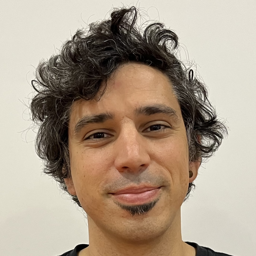

In [ ]:
original_image

### Align Image

Note: in this notebook we'll run alignment on the input image when working on the human facial domain.

In [ ]:
def run_alignment(image_path):
    import dlib
    from scripts.align_faces_parallel import align_face
    if not os.path.exists("shape_predictor_68_face_landmarks.dat"):
        print('Downloading files for aligning face image...')
        os.system('wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2')
        os.system('bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2')
        print('Done.')
    predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
    aligned_image = align_face(filepath=image_path, predictor=predictor)
    print("Aligned image has shape: {}".format(aligned_image.size))
    return aligned_image

Change `Image.ANTIALIAS` with `Image.Resampling.LANCZOS` in `/contentrestyle-encoder/scripts/align_faces_parallel.py`

In [ ]:
if experiment_type in ['ffhq_encode', 'toonify']:
    input_image = run_alignment(image_path)
else:
    input_image = original_image

Aligned image has shape: (256, 256)


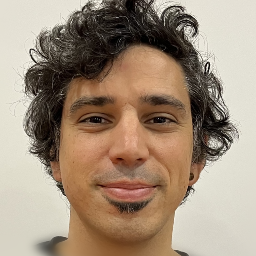

In [ ]:
input_image.resize((256, 256))

## Step 6: Perform Inference

In [ ]:
img_transforms = EXPERIMENT_ARGS['transform']
transformed_image = img_transforms(input_image)

Before running inference, we need to generate the image corresponding to the average latent code. These will be used to initialize the iterative refinement process.

In [ ]:
def get_avg_image(net):
    avg_image = net(net.latent_avg.unsqueeze(0),
                    input_code=True,
                    randomize_noise=False,
                    return_latents=False,
                    average_code=True)[0]
    avg_image = avg_image.to('cuda').float().detach()
    if experiment_type == "cars_encode":
        avg_image = avg_image[:, 32:224, :]
    return avg_image

Now we'll run inference. By default, we'll run using 5 inference steps. You can change the parameter in the cell below.

In [ ]:
opts.n_iters_per_batch = 10
opts.resize_outputs = False  # generate outputs at full resolution

In [ ]:
from utils.inference_utils import run_on_batch

with torch.no_grad():
    avg_image = get_avg_image(net)
    tic = time.time()
    result_batch, result_latents = run_on_batch(transformed_image.unsqueeze(0).cuda(), net, opts, avg_image)
    toc = time.time()
    print('Inference took {:.4f} seconds.'.format(toc - tic))

Inference took 1.3175 seconds.


### Visualize Result

We'll visualize the step-by-step outputs side by side.

In [ ]:
if opts.dataset_type == "cars_encode":
    resize_amount = (256, 192) if opts.resize_outputs else (512, 384)
else:
    resize_amount = (256, 256) if opts.resize_outputs else (opts.output_size, opts.output_size)

In [ ]:
def get_coupled_results(result_batch, transformed_image, opts):
    """
    Visualize output images from left to right (the input image is on the right)
    """
    result_tensors = result_batch[0]  # there's one image in our batch
    result_images = [tensor2im(result_tensors[iter_idx]) for iter_idx in range(opts.n_iters_per_batch)]
    input_im = tensor2im(transformed_image)
    res = np.array(result_images[0].resize(resize_amount))
    for idx, result in enumerate(result_images[1:]):
        res = np.concatenate([res, np.array(result.resize(resize_amount))], axis=1)
    res = np.concatenate([res, input_im.resize(resize_amount)], axis=1)
    res = Image.fromarray(res)
    return res

Note that the step-by-step outputs are shown left-to-right with the original input on the right-hand side.

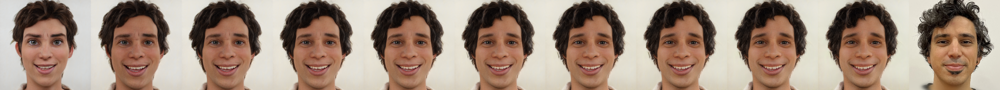

In [ ]:
res = get_coupled_results(result_batch, transformed_image, opts)
res

In [ ]:
# save image
res.save(f'./{experiment_type}_results_{opts.n_iters_per_batch}.jpg')

## Edit the image through the latent space

Many vectors are available: age, gender, pose, etc... They are [in this githug](https://github.com/AmarSaini/Epoching_StyleGan2_Setup/tree/master/stylegan2directions).

Let's choose age!

In [ ]:
# download from url https://github.com/AmarSaini/Epoching_StyleGan2_Setup/raw/refs/heads/master/stylegan2directions/age.npy
! wget https://github.com/AmarSaini/Epoching_StyleGan2_Setup/raw/refs/heads/master/stylegan2directions/age.npy

In [ ]:
direction = np.load('age.npy')
direction = torch.from_numpy(direction).float().cuda()
direction.shape

Now, take the latent of the final image and generate a new one.

Look at the `run_batch` function and the psp class `forward` method in order to understand what how to decode an image just using the latent space.   

In [ ]:
final_latent = # TODO

In [ ]:
edit_alpha = 3.0

edited_codes = final_latent + edit_alpha * direction

# TODO